# **EDA: Sound Event Detection for Driver Safety (Kaggle)**

**Fuente:** https://www.kaggle.com/datasets/ccastorena/sound-event-detection-for-driver-safety

Se trata de un dataset sintético de **19.000 clips de audio** de **10 segundos** diseñado para la detección de eventos sonoros en escenarios de conducción. Incluye **9 clases** seleccionadas como distractores auditivos relevantes para la seguridad vial: Ring Tone, Vibrating, Notification, Speech, Baby Cry, Physiological, Pets, Horns y Sirens. Fue publicado junto a un artículo científico en el que se propone un framework basado en CRNN y YOLO.

## **1. Dependencias**

In [1]:
# Instalar dependencias necesarias
%pip install -q librosa kaggle seaborn plotly tqdm

In [2]:
# Instalar la librería de Kaggle
%pip install kaggle

In [3]:
import os
import json
import glob
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import librosa
import librosa.display
import plotly.express as px
import plotly.graph_objects as go
import zipfile
import warnings
warnings.filterwarnings('ignore')

from plotly.subplots import make_subplots
from tqdm import tqdm
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

## **2. Carga del dataset**

In [4]:
# Estilo general
plt.rcParams['figure.dpi'] = 120
plt.rcParams['figure.facecolor'] = 'black'
plt.rcParams['axes.facecolor'] = '#1a1a2e'
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'

PALETTE = [
    'crimson', 'coral', 'green', 'steelblue',
    'purple', 'salmon', 'teal', 'grey', 'skyblue'
]
CLASSES = ['Ring Tone', 'Vibrating', 'Notification', 'Speech',
           'Baby Cry', 'Physiological', 'Pets', 'Horns', 'Sirens']

print('Dependencias cargadas.')

Dependencias cargadas.


In [5]:
!mkdir -p ~/.kaggle
!echo KGAT_6cd2e8cf3b87b84795f7fc5d8df1eb4f > ~/.kaggle/access_token
!chmod 600 ~/.kaggle/access_token
print("Configuración de Kaggle API completada.")

Configuración de Kaggle API completada.


In [6]:
# Descargar el dataset de Kaggle
DATASET_SLUG = 'ccastorena/sound-event-detection-for-driver-safety'
DOWNLOAD_PATH = './sound-event-detection-for-driver-safety_dataset'

!kaggle datasets download -d {DATASET_SLUG} -p {DOWNLOAD_PATH}

print(f"Dataset descargado a: {DOWNLOAD_PATH}")

Dataset URL: https://www.kaggle.com/datasets/ccastorena/sound-event-detection-for-driver-safety
License(s): CC-BY-SA-4.0
100% 10.9G/10.9G [02:12<00:00, 88.5MB/s]

Dataset descargado a: ./sound-event-detection-for-driver-safety_dataset


In [7]:
# Descomprimir el dataset
zip_file_path = os.path.join(DOWNLOAD_PATH, 'sound-event-detection-for-driver-safety.zip')
extract_to_path = DOWNLOAD_PATH # Extraer en el mismo directorio

print(f"Descomprimiendo {zip_file_path}...")
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
print(f"Dataset descomprimido en: {extract_to_path}")

# Eliminar el archivo zip para ahorrar espacio
os.remove(zip_file_path)
print("Archivo zip eliminado.")

Descomprimiendo ./sound-event-detection-for-driver-safety_dataset/sound-event-detection-for-driver-safety.zip...
Dataset descomprimido en: ./sound-event-detection-for-driver-safety_dataset
Archivo zip eliminado.


In [8]:
BASE = './sound-event-detection-for-driver-safety_dataset'

splits = {
    'train': f'{BASE}/Synthetic_Train/Train/datos.tsv',
    'val': f'{BASE}/Synthetic_Val/Val/datos.tsv',
    'test': f'{BASE}/Synthetic_Test/Test/datos.tsv',
}

dfs = []
for split, path in splits.items():
    tmp = pd.read_csv(path, sep='\t')
    tmp['split'] = split
    dfs.append(tmp)

df = pd.concat(dfs, ignore_index=True)

print(f"Distribución por split:\n{df['split'].value_counts()}")

Distribución por split:
split
train    52329
test      7048
val       6908
Name: count, dtype: int64


In [9]:
print(f"Shape: {df.shape}")

Shape: (66285, 6)


In [10]:
print(f"Columnas: {df.columns.tolist()}")

Columnas: ['Unnamed: 0', 'filename', 'event_label', 'onset', 'offset', 'split']


In [11]:
df.head()

,Unnamed: 0,filename,event_label,onset,offset,split
0,0,1096.wav,Helicopter,2.127149,9.183370,train
1,1,1096.wav,Dog,3.567408,3.964071,train
2,2,1096.wav,Train,5.374677,9.666372,train
3,3,1096.wav,TruckHorn,6.076375,8.343320,train
4,4,10890.wav,Yawn,0.620243,3.450066,train


In [12]:
df.tail()

,Unnamed: 0,filename,event_label,onset,offset,split
66280,7043,1183.wav,Train,1.451143,10.000000,test
66281,7044,1183.wav,Truck,3.767438,10.000000,test
66282,7045,1183.wav,TruckHorn,4.148350,8.240334,test
66283,7046,1183.wav,TrainHorn,6.657036,7.849148,test
66284,7047,1183.wav,RingTone,8.195369,10.000000,test


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66285 entries, 0 to 66284
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   66285 non-null  int64  
 1   filename     66285 non-null  object 
 2   event_label  66285 non-null  object 
 3   onset        66285 non-null  float64
 4   offset       66285 non-null  float64
 5   split        66285 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 3.0+ MB


In [14]:
print("Valores nulos")
df.isnull().sum()

Valores nulos


,0
Unnamed: 0,0
filename,0
event_label,0
onset,0
offset,0
split,0


In [15]:
print("Valores faltantes del dataframe")
df.isna().sum().sum()

Valores faltantes del dataframe


np.int64(0)

In [16]:
print("Valores faltantes para cada columna")
df.isna().sum()

Valores faltantes para cada columna


,0
Unnamed: 0,0
filename,0
event_label,0
onset,0
offset,0
split,0


In [17]:
(df.isna().sum() / len(df) * 100).sort_values(ascending=False)

,0
Unnamed: 0,0.0
filename,0.0
event_label,0.0
onset,0.0
offset,0.0
split,0.0


In [18]:
print("Tipos de datos")
df.dtypes

Tipos de datos


,0
Unnamed: 0,int64
filename,object
event_label,object
onset,float64
offset,float64
split,object


In [19]:
print("Estadísticas descriptivas")
df.describe().round(3)

Estadísticas descriptivas


,Unnamed: 0,onset,offset
count,66285.000,66285.000,66285.000
mean,21389.852,4.240,7.193
std,16323.892,2.607,2.782
min,0.000,0.000,0.045
25%,5523.000,2.030,5.004
50%,19186.000,4.067,7.885
75%,35757.000,6.381,10.000
max,52328.000,9.956,10.000


In [20]:
print("Posibles variables categóricas")
df.select_dtypes(include=['object']).columns

Posibles variables categóricas


Index(['filename', 'event_label', 'split'], dtype='object')

## **3. Exploración de la estructura de los ficheros**

In [21]:
DATA_DIR = Path(DOWNLOAD_PATH)
# Todos los archivos de audio
audio_files = list(DATA_DIR.rglob('*.wav')) + list(DATA_DIR.rglob('*.flac')) + list(DATA_DIR.rglob('*.mp3'))
print(f'Archivos de audio encontrados: {len(audio_files)}')

Archivos de audio encontrados: 18939


In [22]:
# Buscar CSVs / JSONs / TSVs de metadatos
meta_files = list(DATA_DIR.rglob('*.csv')) + list(DATA_DIR.rglob('*.json')) + list(DATA_DIR.rglob('*.tsv'))
print(f'Ficheros de metadatos: {meta_files}')

Ficheros de metadatos: [PosixPath('sound-event-detection-for-driver-safety_dataset/Synthetic_Val/Val/datos_distractor.tsv'), PosixPath('sound-event-detection-for-driver-safety_dataset/Synthetic_Val/Val/datos.tsv'), PosixPath('sound-event-detection-for-driver-safety_dataset/Synthetic_Train/Train/datos_distractor.tsv'), PosixPath('sound-event-detection-for-driver-safety_dataset/Synthetic_Train/Train/datos.tsv'), PosixPath('sound-event-detection-for-driver-safety_dataset/Synthetic_Test/Test/datos_distractor.tsv'), PosixPath('sound-event-detection-for-driver-safety_dataset/Synthetic_Test/Test/datos.tsv')]


In [23]:
# Cargar los archivos .tsv como fuente principal de metadatos
all_metadata_dfs = []
if meta_files:
    for mf in meta_files:
        if mf.suffix == '.tsv' and 'datos.tsv' in mf.name:
            df_current_split = pd.read_csv(mf, sep='\t')

            if 'event_label' in df_current_split.columns:
                df_current_split = df_current_split.rename(columns={'event_label': 'class'})

            audio_base_dir = mf.parent / 'Audio'
            df_current_split['filepath'] = df_current_split['filename'].apply(lambda x: str(audio_base_dir / x))
            all_metadata_dfs.append(df_current_split)
            print(f'Metadatos cargados de {mf.name}:')
            display(df_current_split.head())
            print(df_current_split.dtypes)

# Concatenar todos los DataFrames de metadatos
if all_metadata_dfs:
    df = pd.concat(all_metadata_dfs, ignore_index=True)
    print(f'\nTotal de registros cargados de TSVs: {len(df)}')
else:
    records = []
    for f in audio_files:
        class_name = f.parent.name
        records.append({'filepath': str(f), 'filename': f.name, 'class': class_name})
    df = pd.DataFrame(records)
    print(f'\nDataFrame creado desde nombres de archivo (no se encontraron archivos .tsv): {len(df)}')

print(f'\nShape final del DataFrame: {df.shape}')

Metadatos cargados de datos.tsv:


,Unnamed: 0,filename,class,onset,offset,filepath
0,0,1096.wav,Wiper,3.836272,10.000000,sound-event-detection-for-driver-safety_datase...
1,1,1096.wav,Police,4.912886,6.780036,sound-event-detection-for-driver-safety_datase...
2,2,1096.wav,Cat,6.918612,7.554079,sound-event-detection-for-driver-safety_datase...
3,3,1096.wav,TruckHorn,8.323163,10.000000,sound-event-detection-for-driver-safety_datase...
4,4,960.wav,Police,0.898845,7.121914,sound-event-detection-for-driver-safety_datase...


Unnamed: 0      int64
filename       object
class          object
onset         float64
offset        float64
filepath       object
dtype: object
Metadatos cargados de datos.tsv:


,Unnamed: 0,filename,class,onset,offset,filepath
0,0,1096.wav,Helicopter,2.127149,9.183370,sound-event-detection-for-driver-safety_datase...
1,1,1096.wav,Dog,3.567408,3.964071,sound-event-detection-for-driver-safety_datase...
2,2,1096.wav,Train,5.374677,9.666372,sound-event-detection-for-driver-safety_datase...
3,3,1096.wav,TruckHorn,6.076375,8.343320,sound-event-detection-for-driver-safety_datase...
4,4,10890.wav,Yawn,0.620243,3.450066,sound-event-detection-for-driver-safety_datase...


Unnamed: 0      int64
filename       object
class          object
onset         float64
offset        float64
filepath       object
dtype: object
Metadatos cargados de datos.tsv:


,Unnamed: 0,filename,class,onset,offset,filepath
0,0,1096.wav,TrainHorn,3.400752,7.143468,sound-event-detection-for-driver-safety_datase...
1,1,1096.wav,Cough,7.608028,10.000000,sound-event-detection-for-driver-safety_datase...
2,2,1096.wav,BoatHorn,7.969591,9.129659,sound-event-detection-for-driver-safety_datase...
3,3,960.wav,TruckHorn,1.829004,4.335224,sound-event-detection-for-driver-safety_datase...
4,4,960.wav,Sneeze,4.990897,5.951510,sound-event-detection-for-driver-safety_datase...


Unnamed: 0      int64
filename       object
class          object
onset         float64
offset        float64
filepath       object
dtype: object

Total de registros cargados de TSVs: 66285

Shape final del DataFrame: (66285, 6)


In [24]:
df.head(10)

,Unnamed: 0,filename,class,onset,offset,filepath
0,0,1096.wav,Wiper,3.836272,10.000000,sound-event-detection-for-driver-safety_datase...
1,1,1096.wav,Police,4.912886,6.780036,sound-event-detection-for-driver-safety_datase...
2,2,1096.wav,Cat,6.918612,7.554079,sound-event-detection-for-driver-safety_datase...
3,3,1096.wav,TruckHorn,8.323163,10.000000,sound-event-detection-for-driver-safety_datase...
4,4,960.wav,Police,0.898845,7.121914,sound-event-detection-for-driver-safety_datase...
5,5,960.wav,Train,2.300890,4.404221,sound-event-detection-for-driver-safety_datase...
6,6,960.wav,TrainHorn,4.722830,10.000000,sound-event-detection-for-driver-safety_datase...
7,7,488.wav,TrainHorn,3.932338,10.000000,sound-event-detection-for-driver-safety_datase...
8,8,488.wav,Cough,4.252934,4.495186,sound-event-detection-for-driver-safety_datase...
9,9,488.wav,Scream,4.680354,8.547502,sound-event-detection-for-driver-safety_datase...


## **4. Balance de clases**

              Clase  Cantidad
             Speech      3020
          TruckHorn      3004
          Ambulance      2991
          Vibrating      2988
                Dog      2986
            CarHorn      2966
              Cough      2957
             Police      2957
                Cry      2950
           BoatHorn      2922
       Firefighters      2910
             Sneeze      2882
      Notifications      2862
               Yawn      2861
                Cat      2857
           RingTone      2835
          TrainHorn      2801
              Drink       735
          Motorcyle       724
           Laughter       716
              Truck       715
           Airplane       708
       WarningBeeps       706
              Crash       706
            Thunder       705
               Rain       698
               Door       697
             Scream       697
             Window       697
               Hail       695
              Train       695
              Drift       687
          

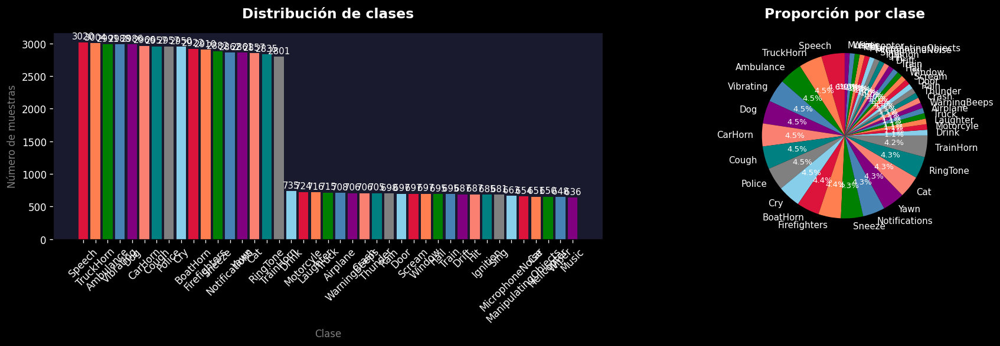


Máximo: 3020 | Mínimo: 636
Ratio max/min: 4.75x
Desviación estándar: 1116.93


In [25]:
class_counts = df['class'].value_counts().reset_index()
class_counts.columns = ['Clase', 'Cantidad']
print(class_counts.to_string(index=False))

# Gráfico de barras
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.patch.set_facecolor('black')

# Barras
ax = axes[0]
bars = ax.bar(class_counts['Clase'], class_counts['Cantidad'],
               color=PALETTE[:len(class_counts)], edgecolor='none')
ax.set_title('Distribución de clases', fontsize=14, fontweight='bold', color='white', pad=15)
ax.set_xlabel('Clase', color='grey')
ax.set_ylabel('Número de muestras', color='grey')
ax.tick_params(axis='x', rotation=45)
for bar, val in zip(bars, class_counts['Cantidad']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20,
            str(val), ha='center', va='bottom', color='white', fontsize=9)

# Pie chart
ax2 = axes[1]
wedges, texts, autotexts = ax2.pie(
    class_counts['Cantidad'], labels=class_counts['Clase'],
    colors=PALETTE[:len(class_counts)], autopct='%1.1f%%',
    startangle=90, textprops={'color': 'white', 'fontsize': 9}
)
for at in autotexts:
    at.set_color('white')
    at.set_fontsize(8)
ax2.set_title('Proporción por clase', fontsize=14, fontweight='bold', color='white', pad=15)

plt.tight_layout()
plt.show()

# Métricas de balance
print(f"\nMáximo: {class_counts['Cantidad'].max()} | Mínimo: {class_counts['Cantidad'].min()}")
print(f"Ratio max/min: {class_counts['Cantidad'].max() / class_counts['Cantidad'].min():.2f}x")
print(f"Desviación estándar: {class_counts['Cantidad'].std():.2f}")

## **5. Análisis de metadatos / etiquetas**

In [26]:
# Verificar nulos y estadísticas básicas
print('Información del DataFrame')
df.info()

Información del DataFrame
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66285 entries, 0 to 66284
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  66285 non-null  int64  
 1   filename    66285 non-null  object 
 2   class       66285 non-null  object 
 3   onset       66285 non-null  float64
 4   offset      66285 non-null  float64
 5   filepath    66285 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 3.0+ MB


In [27]:
print('Valores nulos por columna')
print(df.isnull().sum())

Valores nulos por columna
Unnamed: 0    0
filename      0
class         0
onset         0
offset        0
filepath      0
dtype: int64


In [28]:
print('Clases únicas')
print(df['class'].unique())

Clases únicas
['Wiper' 'Police' 'Cat' 'TruckHorn' 'Train' 'TrainHorn' 'Cough' 'Scream'
 'Window' 'Cry' 'RingTone' 'WarningBeeps' 'Ambulance' 'Rain' 'BoatHorn'
 'Dog' 'Firefighters' 'Sing' 'CarHorn' 'Speech' 'Crash' 'Truck' 'Yawn'
 'Door' 'Vibrating' 'Notifications' 'MicrophoneNoise' 'Ignition' 'Music'
 'Motorcyle' 'ManipulatingObjects' 'Laughter' 'Sneeze' 'Car' 'Thunder'
 'Helicopter' 'Hit' 'Hail' 'Drink' 'Airplane' 'Drift']


In [29]:
# Revisar si hay splits train/val/test en la estructura de carpetas
splits = [p.name for p in DATA_DIR.iterdir() if p.is_dir()]
print('Carpetas de primer nivel:', splits)

if any(s in splits for s in ['train', 'test', 'val', 'validation']):
    split_counts = {}
    for s in splits:
        files_in_split = list((DATA_DIR / s).rglob('*.wav'))
        split_counts[s] = len(files_in_split)
    print('\nDistribución por split:', split_counts)

    fig = px.bar(x=list(split_counts.keys()), y=list(split_counts.values()),
                 labels={'x': 'Split', 'y': 'Número de muestras'},
                 title='Distribución train / val / test',
                 color=list(split_counts.keys()),
                 color_discrete_sequence=PALETTE,
                 template='plotly_dark')
    fig.show()

Carpetas de primer nivel: ['Synthetic_Val', 'Synthetic_Train', 'Synthetic_Test']


## **6. Visualización de formas de onda (waveforms)**


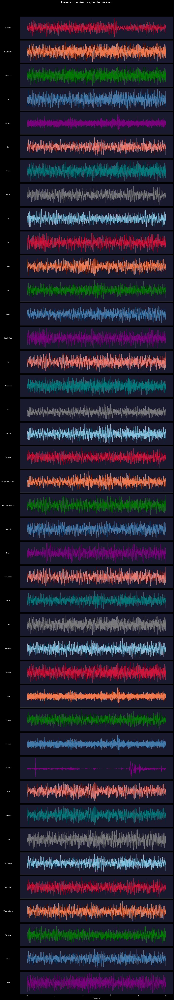

In [30]:
def load_audio(filepath, sr=22050):
    """Carga un archivo de audio con librosa."""
    y, sr = librosa.load(filepath, sr=sr, duration=10.0)
    return y, sr

# Tomar una muestra por clase
sample_per_class = df.groupby('class').first()['filepath'].to_dict()

n_classes = len(sample_per_class)
fig, axes = plt.subplots(n_classes, 1, figsize=(16, n_classes * 2.2))
fig.patch.set_facecolor('black')
fig.suptitle('Formas de onda: un ejemplo por clase', fontsize=16,
             fontweight='bold', color='white', y=1.01)

for idx, (cls, fpath) in enumerate(sample_per_class.items()):
    try:
        y, sr = load_audio(fpath)
        ax = axes[idx] if n_classes > 1 else axes
        time = np.linspace(0, len(y)/sr, len(y))
        ax.plot(time, y, color=PALETTE[idx % len(PALETTE)], linewidth=0.5, alpha=0.9)
        ax.fill_between(time, y, alpha=0.3, color=PALETTE[idx % len(PALETTE)])
        ax.set_ylabel(cls, fontsize=9, color='white', rotation=0, labelpad=80, va='center')
        ax.set_yticks([])
        ax.spines[['top', 'right', 'left']].set_visible(False)
        ax.spines['bottom'].set_color('#333')
        if idx < n_classes - 1:
            ax.set_xticks([])
        else:
            ax.set_xlabel('Tiempo (s)', color='#aaa')
    except Exception as e:
        print(f'Error cargando {fpath}: {e}')

plt.tight_layout()
plt.show()

## **7. Espectrogramas y Mel-espectrogramas**

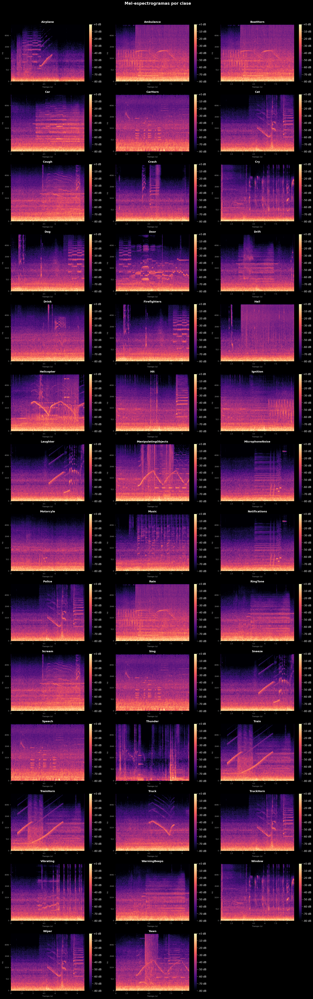

In [31]:
n_cols = 3
n_rows = (n_classes + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4), squeeze=False)
fig.patch.set_facecolor('black')
fig.suptitle('Mel-espectrogramas por clase', fontsize=16,
             fontweight='bold', color='white', y=1.01)

for idx, (cls, fpath) in enumerate(sample_per_class.items()):
    row, col = divmod(idx, n_cols)
    ax = axes[row][col]
    try:
        y, sr = load_audio(fpath)
        mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
        mel_db = librosa.power_to_db(mel, ref=np.max)
        img = librosa.display.specshow(mel_db, sr=sr, x_axis='time',
                                        y_axis='mel', fmax=8000,
                                        ax=ax, cmap='magma')
        ax.set_title(cls, fontsize=11, color='white', fontweight='bold')
        ax.set_xlabel('Tiempo (s)', color='#aaa', fontsize=8)
        ax.set_ylabel('Hz', color='#aaa', fontsize=8)
        ax.tick_params(colors='#aaa', labelsize=7)
        fig.colorbar(img, ax=ax, format='%+2.0f dB')
    except Exception as e:
        ax.text(0.5, 0.5, f'Error:\n{e}', ha='center', va='center',
                color='red', transform=ax.transAxes)
        ax.set_title(cls, color='white')

# Ocultar ejes sobrantes si hay más slots en la grilla que clases
for i in range(n_classes, n_rows * n_cols):
    row, col = divmod(i, n_cols)
    axes[row][col].set_visible(False)

plt.tight_layout()
plt.show()

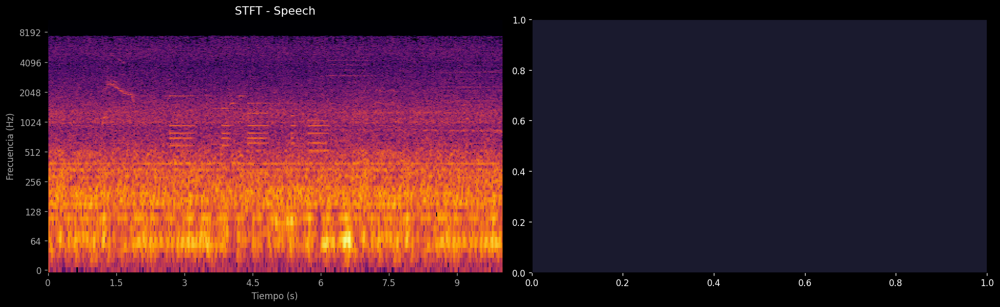

In [32]:
# Espectrograma STFT de un ejemplo específico (Speech vs. Sirens)
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.patch.set_facecolor('black')

for idx, cls in enumerate(['Speech', 'Sirens']):
    if cls in sample_per_class:
        y, sr = load_audio(sample_per_class[cls])
        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
        librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log',
                                  ax=axes[idx], cmap='inferno')
        axes[idx].set_title(f'STFT - {cls}', color='white', fontsize=13)
        axes[idx].tick_params(colors='#aaa')
        axes[idx].set_xlabel('Tiempo (s)', color='#aaa')
        axes[idx].set_ylabel('Frecuencia (Hz)', color='#aaa')

plt.tight_layout()
plt.show()

## **8. Extracción de características de audio**

Calculamos las siguientes características para cada clip:  
- **Duración** (s)  
- **Energía RMS** media  
- **Zero Crossing Rate (ZCR)** media  
- **Centroide espectral** medio (Hz)  
- **Ancho de banda espectral** medio  
- **Roll-off espectral** al 85 %  
- **MFCCs** (13 coeficientes), media y desviación estándar

In [33]:
def extract_features(filepath, sr=22050):
    """Extrae características de un archivo de audio."""
    try:
        y, sr = librosa.load(filepath, sr=sr, duration=10.0)

        features = {
            'duration': librosa.get_duration(y=y, sr=sr),
            'rms_mean': float(np.mean(librosa.feature.rms(y=y))),
            'rms_std': float(np.std(librosa.feature.rms(y=y))),
            'zcr_mean': float(np.mean(librosa.feature.zero_crossing_rate(y))),
            'spectral_centroid_mean': float(np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))),
            'spectral_bandwidth_mean': float(np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))),
            'spectral_rolloff_mean': float(np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=0.85))),
        }

        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
        for i in range(13):
            features[f'mfcc_{i+1}_mean'] = float(np.mean(mfccs[i]))
            features[f'mfcc_{i+1}_std'] = float(np.std(mfccs[i]))

        return features
    except:
        return None

# Procesar muestra representativa (1000 clips por velocidad; aumenta según recursos)
N_SAMPLES = min(1000, len(df))
df_sample = df.groupby('class', group_keys=False).apply(
    lambda x: x.sample(min(len(x), N_SAMPLES // len(df['class'].unique())), random_state=42)
).reset_index(drop=True)

print(f'Procesando {len(df_sample)} clips de audio...')
feature_list = []
for _, row in tqdm(df_sample.iterrows(), total=len(df_sample)):
    feats = extract_features(row['filepath'])
    if feats:
        feats['class'] = row['class']
        feats['filepath'] = row['filepath']
        feature_list.append(feats)

df_feats = pd.DataFrame(feature_list)
print(f'\nFeatures extraídas para {len(df_feats)} clips')

Procesando 984 clips de audio...


100%|██████████| 984/984 [02:03<00:00,  7.94it/s]


Features extraídas para 984 clips


In [34]:
df_feats.describe().round(3)

,duration,rms_mean,rms_std,zcr_mean,spectral_centroid_mean,spectral_bandwidth_mean,spectral_rolloff_mean,mfcc_1_mean,mfcc_1_std,mfcc_2_mean,...,mfcc_9_mean,mfcc_9_std,mfcc_10_mean,mfcc_10_std,mfcc_11_mean,mfcc_11_std,mfcc_12_mean,mfcc_12_std,mfcc_13_mean,mfcc_13_std
count,984.0,984.000,984.000,984.000,984.000,984.000,984.000,984.000,984.000,984.000,...,984.000,984.000,984.000,984.000,984.000,984.000,984.000,984.000,984.000,984.000
mean,10.0,0.281,0.054,0.013,451.246,881.727,851.440,-218.169,35.516,182.475,...,6.465,5.939,6.434,5.529,7.520,5.157,3.048,5.205,6.968,5.496
std,0.0,0.047,0.013,0.006,169.924,224.408,449.837,36.146,12.815,15.928,...,3.688,1.771,3.462,1.558,2.644,1.395,2.823,1.474,2.341,1.853
min,10.0,0.019,0.024,0.007,211.947,481.773,275.735,-387.583,6.069,93.422,...,-8.821,3.137,-7.480,2.905,0.837,3.048,-6.743,3.018,-3.119,3.043
25%,10.0,0.266,0.045,0.010,344.515,730.286,574.427,-243.926,26.204,175.944,...,4.403,4.626,4.342,4.426,5.719,4.134,1.194,4.104,5.460,4.201
50%,10.0,0.290,0.053,0.012,414.514,842.223,743.670,-217.592,34.046,185.212,...,6.754,5.595,6.211,5.171,7.389,4.807,3.008,4.820,6.883,4.956
75%,10.0,0.310,0.061,0.014,501.977,977.540,961.356,-191.755,44.575,192.651,...,8.810,6.831,8.678,6.275,9.272,5.852,4.835,5.931,8.427,6.295
max,10.0,0.378,0.119,0.074,1524.712,1900.433,3606.087,-110.895,83.571,211.026,...,17.757,13.373,17.325,13.266,16.212,12.132,15.598,11.158,16.310,15.516


## **9. Distribuciones y comparativas por clase**

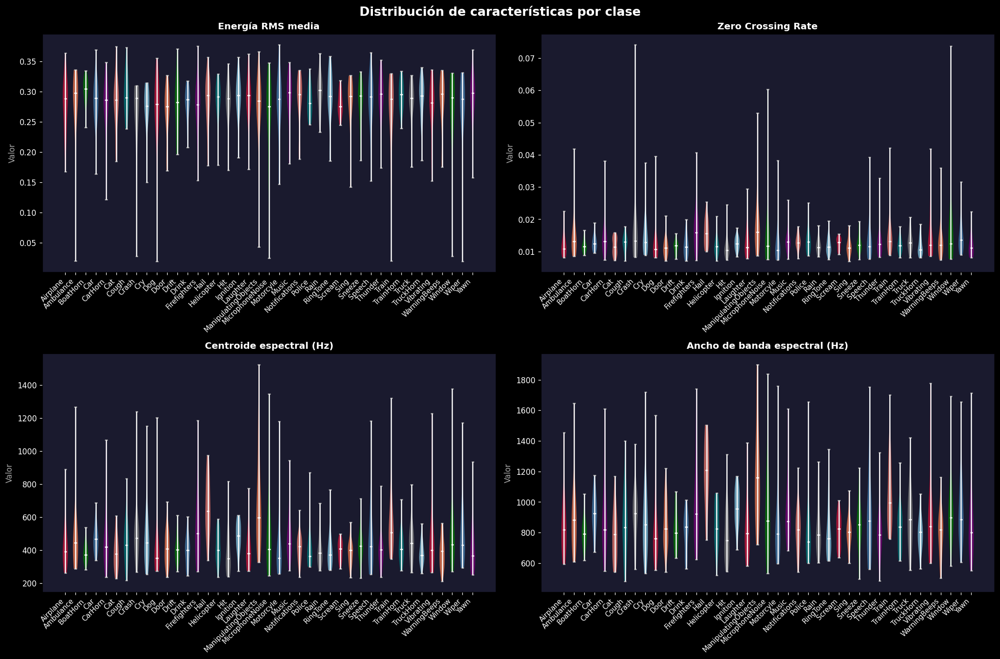

In [35]:
# Violin plots de las features principales
features_to_plot = ['rms_mean', 'zcr_mean', 'spectral_centroid_mean', 'spectral_bandwidth_mean']
titles = ['Energía RMS media', 'Zero Crossing Rate', 'Centroide espectral (Hz)', 'Ancho de banda espectral (Hz)']

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.patch.set_facecolor('black')
fig.suptitle('Distribución de características por clase', fontsize=16,
             fontweight='bold', color='white')

for ax, feat, title in zip(axes.flat, features_to_plot, titles):
    data_by_class = [df_feats[df_feats['class'] == c][feat].dropna().values
                     for c in df_feats['class'].unique()]
    classes = list(df_feats['class'].unique())

    vp = ax.violinplot(data_by_class, positions=range(len(classes)),
                       showmedians=True, showmeans=False)
    for idx, body in enumerate(vp['bodies']):
        body.set_facecolor(PALETTE[idx % len(PALETTE)])
        body.set_alpha(0.7)
    vp['cmedians'].set_color('white')
    vp['cbars'].set_color('white')
    vp['cmaxes'].set_color('#aaa')
    vp['cmins'].set_color('#aaa')

    ax.set_xticks(range(len(classes)))
    ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9, color='white')
    ax.set_title(title, fontsize=12, color='white', fontweight='bold')
    ax.set_ylabel('Valor', color='#aaa')

plt.tight_layout()
plt.show()

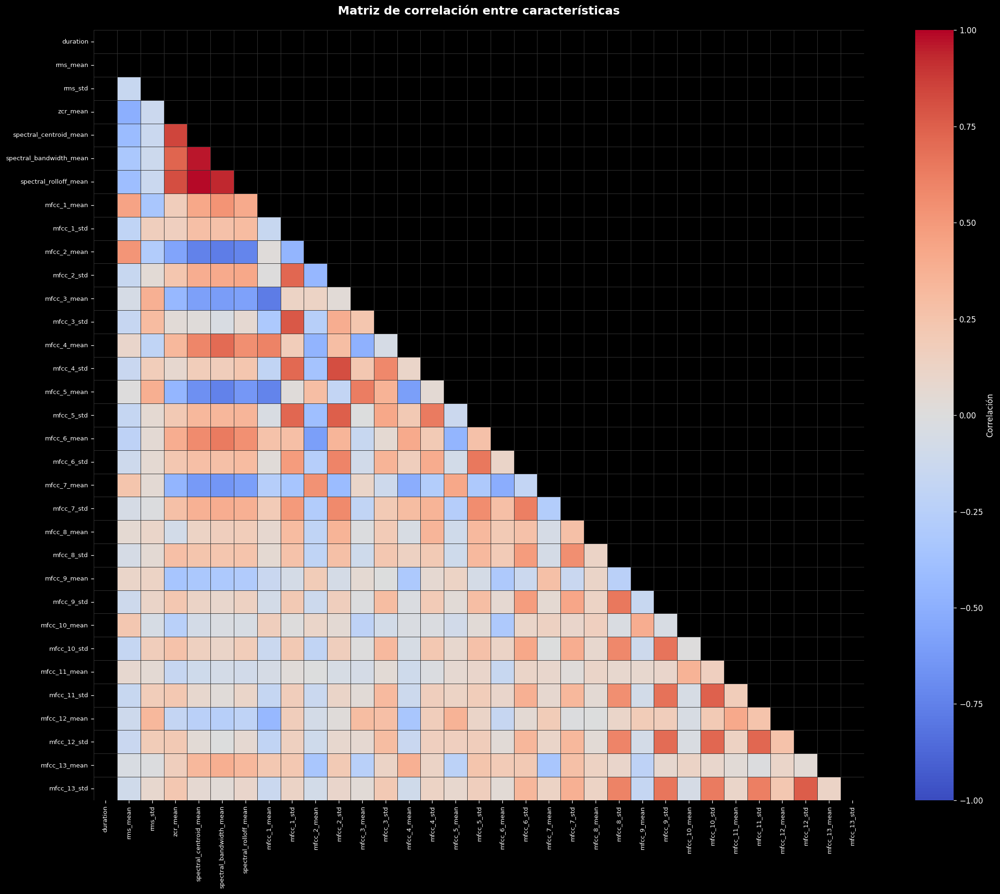

In [36]:
# Heatmap de correlación entre características
numeric_feats = [c for c in df_feats.columns
                 if c not in ['class', 'filepath'] and df_feats[c].dtype != object]
corr = df_feats[numeric_feats].corr()

fig, ax = plt.subplots(figsize=(20, 16))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap='coolwarm', center=0,
            vmin=-1, vmax=1, annot=False, square=True,
            linewidths=0.3, linecolor='#333',
            cbar_kws={'label': 'Correlación'}, ax=ax)
ax.set_title('Matriz de correlación entre características', fontsize=15,
             color='white', fontweight='bold', pad=20)
ax.tick_params(colors='white', labelsize=8)
plt.tight_layout()
plt.show()

In [37]:
# Boxplot interactivo de centroide espectral por clase (Plotly)
fig = px.box(
    df_feats, x='class', y='spectral_centroid_mean',
    color='class', color_discrete_sequence=PALETTE,
    title='Centroide espectral medio por clase',
    labels={'class': 'Clase', 'spectral_centroid_mean': 'Centroide (Hz)'},
    template='plotly_dark'
)
fig.update_layout(showlegend=False, title_font_size=16)
fig.show()

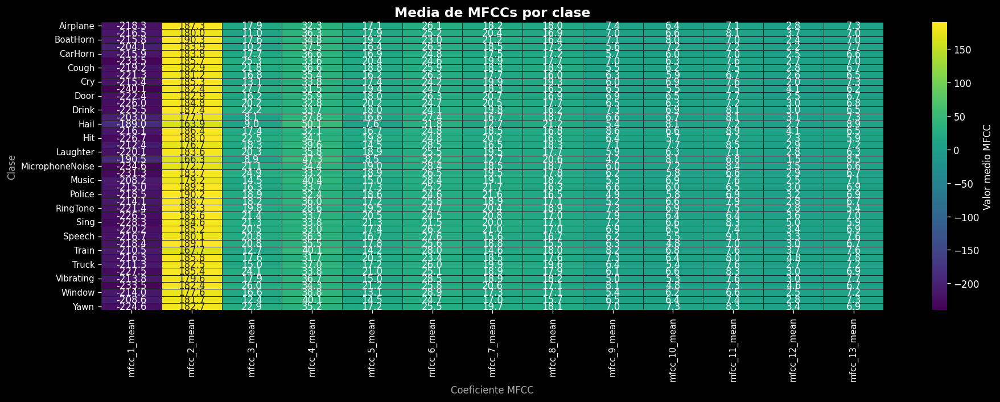

In [38]:
# Media de MFCCs por clase - heatmap
mfcc_cols = [c for c in df_feats.columns if 'mfcc' in c and '_mean' in c]
mfcc_by_class = df_feats.groupby('class')[mfcc_cols].mean()

fig, ax = plt.subplots(figsize=(16, 6))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

sns.heatmap(mfcc_by_class, cmap='viridis', annot=True, fmt='.1f',
            linewidths=0.5, linecolor='#222', ax=ax,
            cbar_kws={'label': 'Valor medio MFCC'})
ax.set_title('Media de MFCCs por clase', fontsize=14, color='white', fontweight='bold')
ax.tick_params(colors='white', labelsize=9)
ax.set_xlabel('Coeficiente MFCC', color='#aaa')
ax.set_ylabel('Clase', color='#aaa')
plt.tight_layout()
plt.show()

In [39]:
# Scatter 2D: RMS vs. Centroide espectral coloreado por clase (Plotly)
fig = px.scatter(
    df_feats,
    x='rms_mean', y='spectral_centroid_mean',
    color='class', color_discrete_sequence=PALETTE,
    title='RMS vs. Centroide espectral por clase',
    labels={
        'rms_mean': 'Energía RMS media',
        'spectral_centroid_mean': 'Centroide espectral (Hz)',
        'class': 'Clase'
    },
    opacity=0.7,
    template='plotly_dark',
    hover_data=['class']
)
fig.update_traces(marker=dict(size=5))
fig.update_layout(title_font_size=15)
fig.show()

In [40]:
# PCA para visualización 2D del espacio de características
X = df_feats[numeric_feats].dropna()
labels = df_feats.loc[X.index, 'class']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
explained = pca.explained_variance_ratio_

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['class'] = labels.values

fig = px.scatter(
    df_pca, x='PC1', y='PC2', color='class',
    color_discrete_sequence=PALETTE,
    title=f'PCA - Espacio de características (var. explicada: PC1={explained[0]:.2%}, PC2={explained[1]:.2%})',
    template='plotly_dark',
    opacity=0.7
)
fig.update_traces(marker=dict(size=5))
fig.update_layout(title_font_size=13)
fig.show()

print(f'\nVarianza explicada por PC1: {explained[0]:.2%}')
print(f'Varianza explicada por PC2: {explained[1]:.2%}')
print(f'Total: {sum(explained):.2%}')


Varianza explicada por PC1: 26.92%
Varianza explicada por PC2: 17.97%
Total: 44.89%


## **10. Resumen estadístico por clase**

In [41]:
summary = df_feats.groupby('class')[['rms_mean', 'zcr_mean', 'spectral_centroid_mean',
                                      'spectral_bandwidth_mean', 'spectral_rolloff_mean']].agg(
    ['mean', 'std', 'min', 'max']
).round(4)

print('Resumen estadístico por clase')
display(summary)

Resumen estadístico por clase


rms_mean                         zcr_mean                  \
                        mean     std     min     max     mean     std     min   
class                                                                           
Airplane              0.2764  0.0468  0.1676  0.3638   0.0125  0.0042  0.0081   
Ambulance             0.2804  0.0646  0.0199  0.3364   0.0146  0.0069  0.0085   
BoatHorn              0.3016  0.0225  0.2409  0.3346   0.0117  0.0020  0.0088   
Car                   0.2853  0.0393  0.1640  0.3697   0.0128  0.0024  0.0095   
CarHorn               0.2733  0.0515  0.1216  0.3485   0.0140  0.0060  0.0073   
Cat                   0.2793  0.0470  0.1845  0.3745   0.0116  0.0027  0.0072   
Cough                 0.2944  0.0354  0.2381  0.3735   0.0127  0.0027  0.0070   
Crash                 0.2607  0.0642  0.0278  0.3101   0.0158  0.0128  0.0082   
Cry                   0.2690  0.0434  0.1500  0.3149   0.0148  0.0061  0.0089   
Dog                   0.2657  0.0686  0.0191  0.3555   0.0123  0.0065  0.0081   
Door                  0.2633  0.0461  0.1691  0.3271   0.0116  0.0033  0.0072   
Drift                 0.2751  0.0460  0.1959  0.3708   0.0114  0.0021  0.0077   
Drink                 0.2816  0.0276  0.2079  0.3177   0.0119  0.0034  0.0071   
Firefighters          0.2743  0.0465  0.1530  0.3757   0.0165  0.0070  0.0072   
Hail                  0.2821  0.0437  0.1780  0.3569   0.0159  0.0042  0.0100   
Helicopter            0.2860  0.0334  0.1786  0.3296   0.0120  0.0033  0.0071   
Hit                   0.2794  0.0428  0.1703  0.3460   0.0114  0.0037  0.0074   
Ignition              0.2851  0.0429  0.1904  0.3569   0.0124  0.0022  0.0083   
Laughter              0.2909  0.0387  0.1715  0.3621   0.0129  0.0048  0.0079   
ManipulatingObjects   0.2761  0.0604  0.0426  0.3662   0.0180  0.0092  0.0087   
MicrophoneNoise       0.2602  0.0719  0.0247  0.3478   0.0147  0.0114  0.0075   
Motorcyle             0.2756  0.0565  0.1467  0.3780   0.0119  0.0062  0.0074   
Music                 0.2865  0.0431  0.1810  0.3485   0.0134  0.0039  0.0077   
Notifications         0.2815  0.0456  0.1882  0.3354   0.0130  0.0026  0.0078   
Police                0.2845  0.0261  0.2457  0.3381   0.0135  0.0040  0.0086   
Rain                  0.2973  0.0327  0.2334  0.3635   0.0119  0.0025  0.0084   
RingTone              0.2903  0.0457  0.1852  0.3585   0.0122  0.0030  0.0076   
Scream                0.2802  0.0214  0.2443  0.3188   0.0124  0.0019  0.0092   
Sing                  0.2846  0.0421  0.1424  0.3267   0.0117  0.0029  0.0069   
Sneeze                0.2824  0.0361  0.1859  0.3334   0.0124  0.0028  0.0075   
Speech                0.2849  0.0456  0.1525  0.3646   0.0129  0.0063  0.0077   
Thunder               0.2923  0.0395  0.1738  0.3526   0.0129  0.0056  0.0082   
Train                 0.2619  0.0717  0.0197  0.3299   0.0150  0.0066  0.0089   
TrainHorn             0.2936  0.0253  0.2396  0.3338   0.0120  0.0024  0.0080   
Truck                 0.2867  0.0329  0.1755  0.3270   0.0133  0.0033  0.0081   
TruckHorn             0.2890  0.0347  0.1862  0.3400   0.0116  0.0028  0.0080   
Vibrating             0.2743  0.0473  0.1518  0.3366   0.0145  0.0075  0.0086   
WarningBeeps          0.2832  0.0455  0.1750  0.3354   0.0136  0.0063  0.0074   
Window                0.2753  0.0644  0.0273  0.3309   0.0158  0.0130  0.0077   
Wiper                 0.2794  0.0614  0.0190  0.3316   0.0144  0.0050  0.0090   
Yawn                  0.2865  0.0449  0.1580  0.3693   0.0117  0.0034  0.0081   

                            spectral_centroid_mean                      \
                        max                   mean       std       min   
class                                                                    
Airplane             0.0225               436.0851  152.3164  262.7981   
Ambulance            0.0419               485.6298  219.5758  287.1872   
BoatHorn             0.0166               382.4892   59.9253  280.4646   
Car        

## **11. Conclusiones**

| Aspecto | Observación |
|---|---|
| **Balance de clases** | El dataset cuenta con ~2.111 muestras por clase (9 clases × 19.000 ÷ 9). |
| **Duración** | Todos los clips tienen 10 segundos exactos. |
| **Distinguibilidad** | Clases como *Sirens* y *Horns* presentan centorides espectrales altos y ZCR elevados, diferenciándose de *Speech* o *Physiological*. |
| **MFCCs** | Los MFCCs aportan gran poder discriminante entre clases, especialmente los primeros coeficientes. |
| **PCA** | La separabilidad lineal es parcial; se esperan mejores resultados con modelos no lineales (CRNN, YOLO-audio). |